# Definitions

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import sys, platform, os
os.environ['OMP_NUM_THREADS'] = '10'
import matplotlib
import math
import warnings
from matplotlib import pyplot as plt
import numpy as np
import euclidemu2
import scipy
import cosmolike_roman_real_interface as ci
from getdist import IniFile
import itertools
import iminuit
import functools
from scipy.interpolate import interp1d
print(sys.version)
print(os.getcwd())

# GENERAL PLOT OPTIONS
matplotlib.rcParams['mathtext.fontset'] = 'stix'
matplotlib.rcParams['font.family'] = 'STIXGeneral'
matplotlib.rcParams['mathtext.rm'] = 'Bitstream Vera Sans'
matplotlib.rcParams['mathtext.it'] = 'Bitstream Vera Sans:italic'
matplotlib.rcParams['mathtext.bf'] = 'Bitstream Vera Sans:bold'
matplotlib.rcParams['xtick.bottom'] = True
matplotlib.rcParams['xtick.top'] = False
matplotlib.rcParams['ytick.right'] = False
matplotlib.rcParams['axes.edgecolor'] = 'black'
matplotlib.rcParams['axes.linewidth'] = '1.0'
matplotlib.rcParams['axes.labelsize'] = 'medium'
matplotlib.rcParams['axes.grid'] = True
matplotlib.rcParams['grid.linewidth'] = '0.0'
matplotlib.rcParams['grid.alpha'] = '0.18'
matplotlib.rcParams['grid.color'] = 'lightgray'
matplotlib.rcParams['legend.labelspacing'] = 0.77
matplotlib.rcParams['savefig.bbox'] = 'tight'
matplotlib.rcParams['savefig.format'] = 'pdf'

# ----------------------------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------------------------
# BE CAREFUL: you need texlive-latex-base texlive-latex-extra texlive-fonts-recommended dvipng ghostscript cm-super
matplotlib.rcParams['text.usetex'] = True
# ----------------------------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------------------------

# Jupyter Notebook Display options
import IPython
IPython.display.display(IPython.display.HTML("<style>:root { --jp-notebook-max-width: 85% !important; }</style>"))
IPython.display.display(IPython.display.HTML("<style>div.output_scroll { height: 54em; }</style>"))


Classy could not be found in your system.
Here are some suggestions:

	 -Download the Class from class-code.net and install it
	  together with its wrapper classy (type 'make' instead of
	  'make class'
	 -If you know that Class is installed on your system
	  and yet classy could not be installed, try re-compiling
	  Class with just ''make'' instead of ''make class''
NOTICE: Even without classy you can still use EuclidEmulator2
        to emulate boost factors. You won't be able to compute
        full power spectra, though.
3.11.12 | packaged by conda-forge | (main, Apr 10 2025, 22:18:52) [Clang 18.1.8 ]
/Users/vivianmiranda/data/COCOA/september2026/test/cocoa/Cocoa/projects/roman_real


In [2]:
# IMPORT CAMB
sys.path.insert(0, os.environ['ROOTDIR']+'/external_modules/code/CAMB/build/lib.linux-x86_64-'+os.environ['PYTHON_VERSION'])
import camb
from camb import model
print('Using CAMB %s installed at %s'%(camb.__version__,os.path.dirname(camb.__file__)))

# IMPORT SHARED NOTEBOOK UTILITIES (cosmolike_core)
sys.path.insert(0, os.environ['ROOTDIR']+'/external_modules/code/cosmolike_core')
import cosmolike_notebook_utils as cnu
print('Using cosmolike_notebook_utils installed at %s'%(os.path.dirname(cnu.__file__)))


# IMPORT THE PROJECT'S NOTEBOOK WRAPPERS (projects/roman_real/interface):
# the probe, chi2, response, Fisher, and bfmt wrappers every notebook
# of this project shares
import cosmolike_roman_real_notebook_wrappers as nw
print('Using notebook wrappers installed at %s'%(nw.__file__))

Using CAMB 1.6.7 installed at /Users/vivianmiranda/data/COCOA/september2026/test/cocoa/Cocoa/.local/lib/python3.11/site-packages/camb
Using cosmolike_notebook_utils installed at /Users/vivianmiranda/data/COCOA/september2026/test/cocoa/Cocoa/external_modules/code/cosmolike_core/cosmolike_notebook_utils


In [3]:
CAMBAccuracyBoost = 1.0
non_linear_emul = 2
CLprobe="xi"

path= "../../external_modules/data/roman_real"
data_file="example1.dataset"
ggl_exclude=[[6,0],[7,0],[7,1]]

IA_model = 0
IA_redshift_evolution = 3
IA_code = 0  # 0 = C FASTPT, 1 = Python FAST-PT (NLA always uses 0)

ntheta = 15
theta_min_arcmin = 2.5 
theta_max_arcmin = 250
lmax = 70000

# hand this notebook's yaml-mirroring values to the shared wrappers
nw.configure(lmax=lmax,
             ntheta=ntheta,
             theta_min_arcmin=theta_min_arcmin,
             theta_max_arcmin=theta_max_arcmin,
             non_linear_emul=non_linear_emul)

In [ ]:
# The project fiducial point lives in the wrappers module
# (interface/cosmolike_roman_real_notebook_wrappers.py), shared by
# every notebook. The names are imported so the sweep cells below can
# build shifted vectors from them; override any value per call
# instead, e.g. nw.get_chi2(omegam=0.31).
from cosmolike_roman_real_notebook_wrappers import (
    As_1e9, ns, H0, omegab, omegam, mnu, w, w0pwa,
    roman_A1_1, roman_A1_2,
    roman_DZ_S1, roman_DZ_S2, roman_DZ_S3, roman_DZ_S4,
    roman_DZ_S5, roman_DZ_S6, roman_DZ_S7, roman_DZ_S8,
    roman_M1, roman_M2, roman_M3, roman_M4,
    roman_M5, roman_M6, roman_M7, roman_M8,
    roman_DZ_L1, roman_DZ_L2, roman_DZ_L3, roman_DZ_L4,
    roman_DZ_L5, roman_DZ_L6, roman_DZ_L7, roman_DZ_L8,
    roman_B1_1, roman_B1_2, roman_B1_3, roman_B1_4,
    roman_B1_5, roman_B1_6, roman_B1_7, roman_B1_8,
    roman_PM1, roman_PM2, roman_PM3, roman_PM4,
    roman_PM5, roman_PM6, roman_PM7, roman_PM8)

In [5]:
# get_camb_cosmology lives in cosmolike_core, shared by every project's
# notebooks; call it as cnu.get_camb_cosmology (imported above):
# external_modules/code/cosmolike_core/cosmolike_notebook_utils


In [ ]:
# C_ss_tomo_limber lives in this project's interface/
# (cosmolike_roman_real_notebook_wrappers, imported above as nw),
# shared by every notebook of this project; call as
# nw.C_ss_tomo_limber.

In [ ]:
# xi lives in this project's interface/
# (cosmolike_roman_real_notebook_wrappers, imported above as nw),
# shared by every notebook of this project; call as
# nw.xi.

In [ ]:
# Init Cosmolike (the full sequence lives in nw.init_cosmolike)
ini = nw.init_cosmolike()
allsims = nw.allsims

# Basic Plot routines

In [9]:
# plot_C_ss_tomo_limber lives in cosmolike_core (shared); call it as
# cnu.plot_C_ss_tomo_limber (imported above)


In [10]:
# plot_xi lives in cosmolike_core (shared); call it as cnu.plot_xi
# (imported above)

# Let's plot how cosmological and nuisance parameters affect $C_{\ell}^{EE}$

In [11]:
lmin = 100.
lmax = 4500.
ell = np.arange(lmin, lmax, 20.) # Make sure np.arange are set w/ float numbers (otherwise there are aliasing problems)
param = np.arange(0.2, 0.4, 0.02)     
C_ss = []
for x in param:
    (Cl, tmp) = nw.C_ss_tomo_limber(ell=ell, omegam=x)
    C_ss.append(Cl)

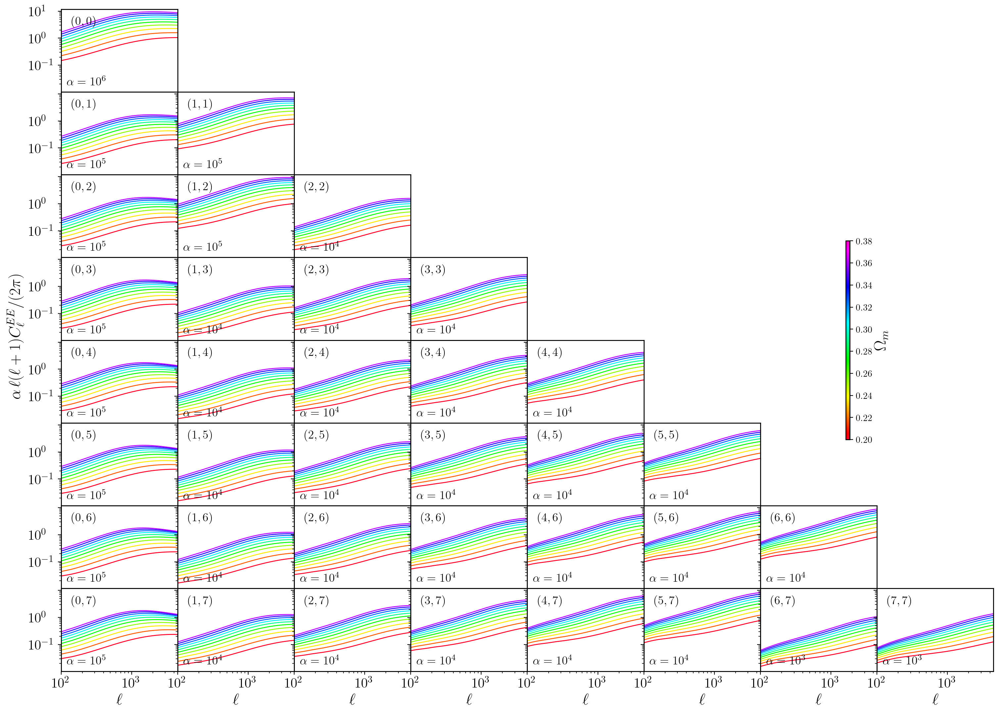

In [12]:
cnu.plot_C_ss_tomo_limber(ell=ell,
                          C_ss=C_ss,
                          param=param,
                          colorbarlabel="$\Omega_m$",
                          yaxislabelsize = 17,
                          xaxislabelsize = 17,
                          xaxisticklabelsize=15,
                          yaxisticklabelsize=15,
                          figsize = (18, 13),
                          lmin = lmin,
                          lmax = lmax,
                          wspace=0.4,
                          rescale=1,
                          ydecades=4)

In [19]:
lmin = 100.
lmax = 4500.
ell = np.arange(lmin,lmax, 20.) # Make sure arange are with float numbers (otherwise there are aliasing problems)
param = np.arange(0.85, 1.1, 0.02)
C_ss = []
for x in param:
    (Cl, tmp) = nw.C_ss_tomo_limber(ell=ell, ns=x)
    C_ss.append(Cl)
# Plot the Ratio over ref cosmology
(ref, tmp) = nw.C_ss_tomo_limber(ell=ell)

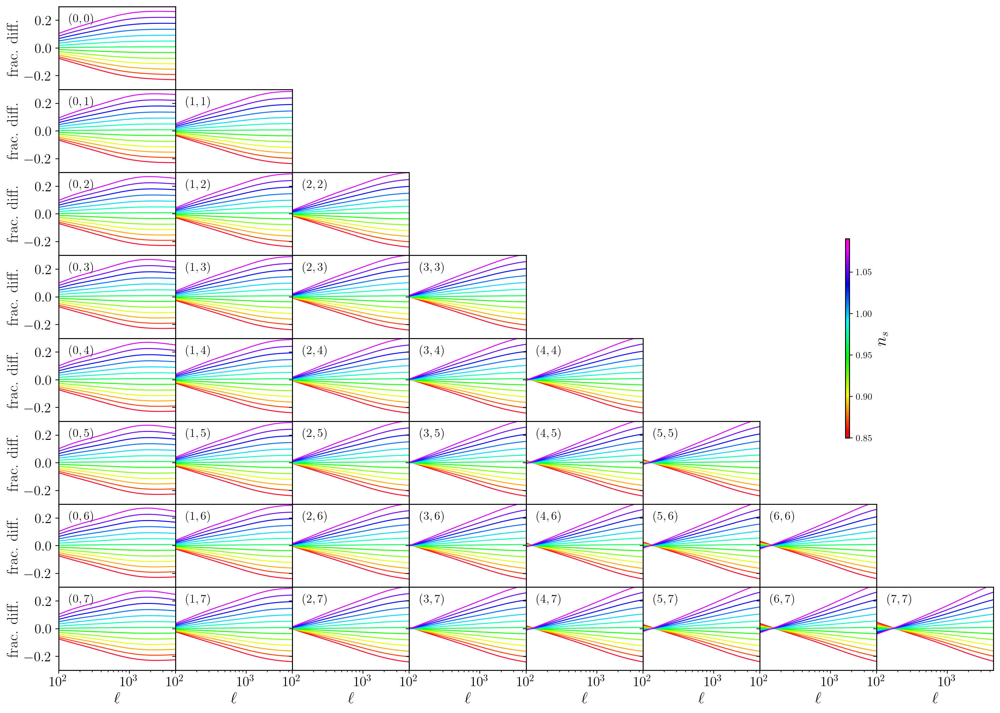

In [21]:
cnu.plot_C_ss_tomo_limber(ell=ell,
                          C_ss=C_ss,
                          C_ss_ref=ref,
                          param=param,
                          colorbarlabel="$n_s$",
                          figsize = (18, 13),
                          yaxislabelsize = 17,
                          xaxislabelsize = 17,
                          xaxisticklabelsize=15,
                          yaxisticklabelsize=15,
                          lmin = lmin,
                          lmax = lmax,
                          ylim = [0.7,1.3],
                          wspace=0.4)

In [22]:
lmin = 100.
lmax = 4500.
ell = np.arange(lmin, lmax, 20.) # Make sure np.arange are set w/ float numbers (otherwise there are aliasing problems)
param = np.arange(0.0, 3, 0.1)     
C_ss = []
for x in param:
    (Cl, tmp) = nw.C_ss_tomo_limber(ell=ell, A1  = [x, roman_A1_2, 0, 0, 0, 0, 0, 0])
    C_ss.append(Cl)

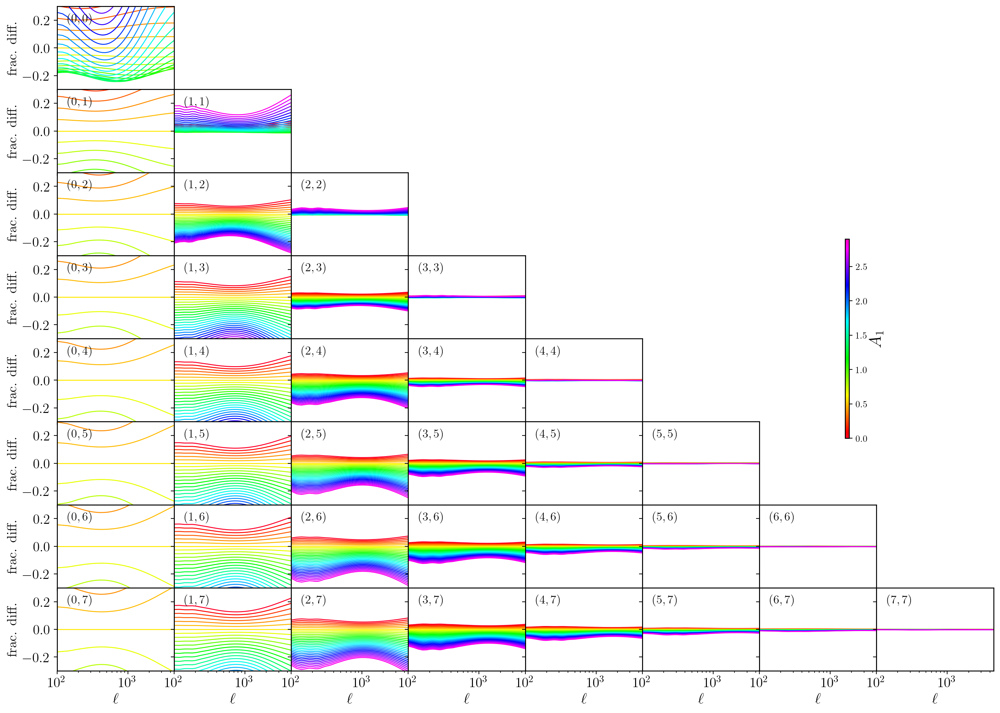

In [23]:
cnu.plot_C_ss_tomo_limber(ell=ell,
                          C_ss=C_ss,
                          C_ss_ref=ref,
                          param=param,
                          colorbarlabel="$A_1$",
                          figsize = (18, 13),
                          yaxislabelsize = 15,
                          xaxisticklabelsize=15,
                          yaxisticklabelsize=15,
                          lmin = lmin,
                          lmax = lmax,
                          ylim = [0.7,1.3],
                          wspace=0.4)

In [24]:
lmin = 100.
lmax = 4500.
ell = np.arange(lmin, lmax, 20.) # Make sure np.arange are set w/ float numbers (otherwise there are aliasing problems)
param = np.arange(-2, 2, 0.1)     
C_ss = []
for x in param:
    (Cl, tmp) = nw.C_ss_tomo_limber(ell=ell, A1  = [roman_A1_1, x, 0, 0, 0, 0, 0, 0])
    C_ss.append(Cl)

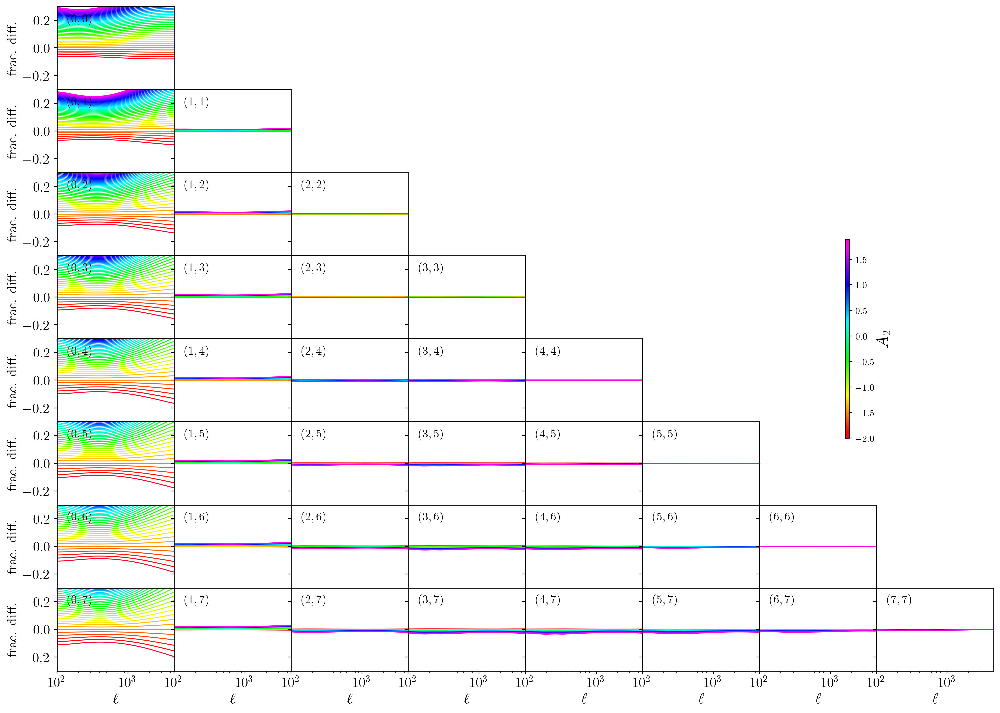

In [25]:
cnu.plot_C_ss_tomo_limber(ell=ell,
                          C_ss=C_ss,
                          C_ss_ref=ref,
                          param=param,
                          colorbarlabel="$A_2$",
                          figsize = (18, 13),
                          yaxislabelsize = 15,
                          xaxisticklabelsize=15,
                          yaxisticklabelsize=15,
                          lmin = lmin,
                          lmax = lmax,
                          ylim = [0.7,1.3],
                          wspace=0.4)

# Let's plot how cosmological and nuisance parameters affect $\xi(\theta)$

In [31]:
param = np.arange(0.2, 0.4, 0.02)
xi_theta = []
for x in param:
    xi_theta.append(nw.xi(omegam = x))

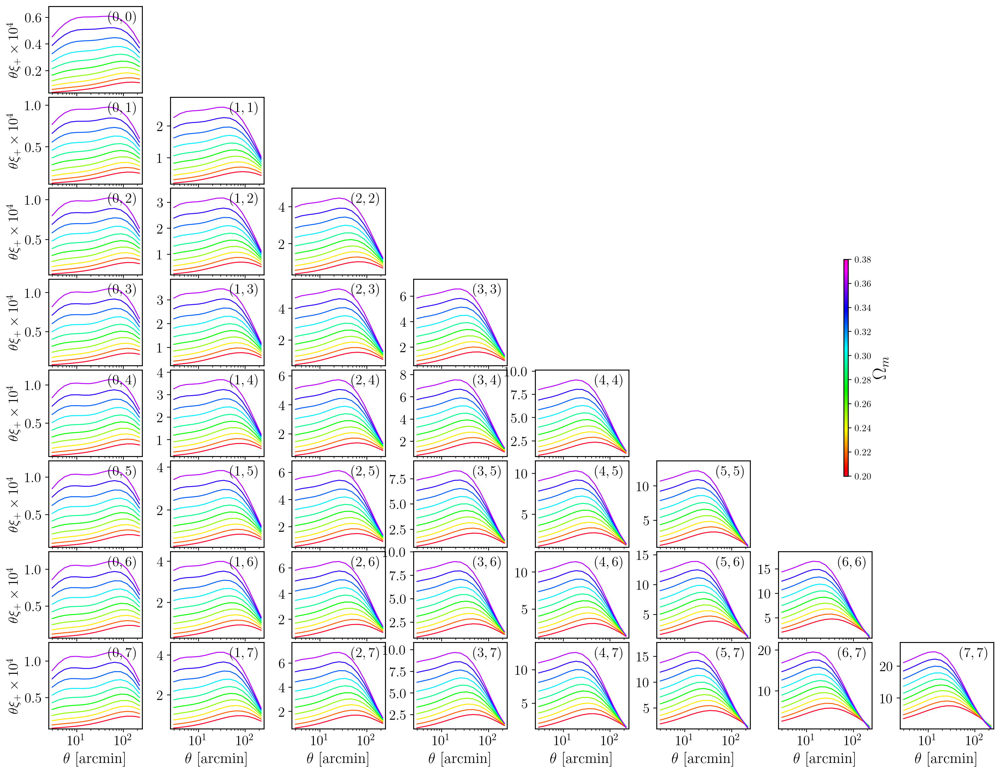

In [35]:
cnu.plot_xi(pm = 1,
            xi = xi_theta,
            param = param,
            colorbarlabel = "$\Omega_m$",
            yaxislabelsize = 15,
            xaxisticklabelsize=15,
            yaxisticklabelsize=15,
            figsize = (18, 14),
            thetashow=[2.5,250],
            wspace=0.3,
            rescale=None)

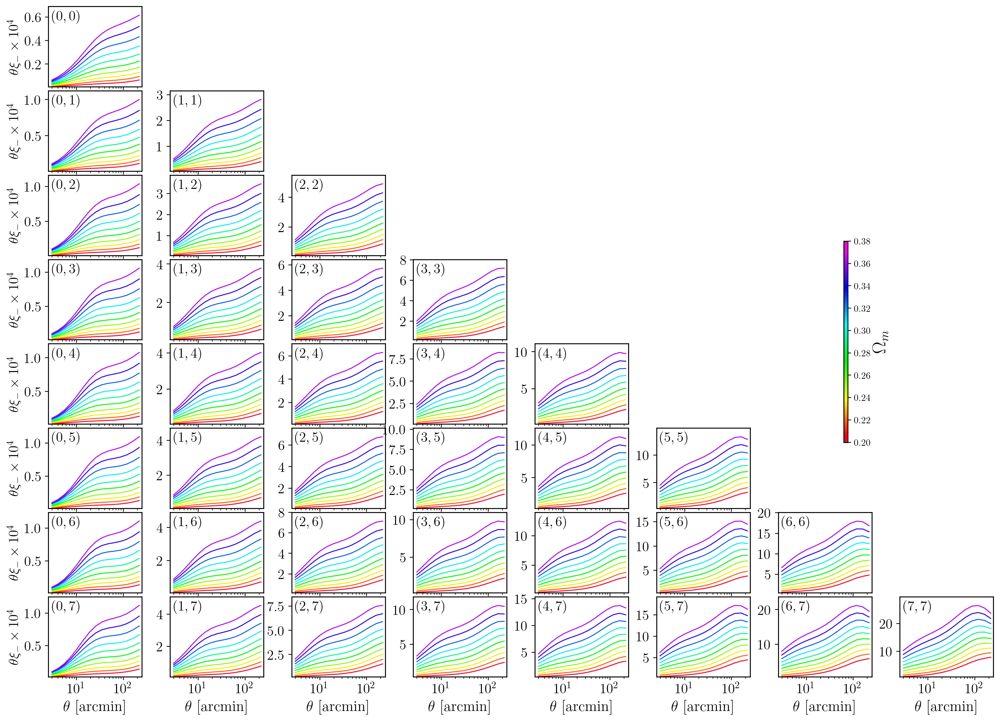

In [30]:
cnu.plot_xi(pm = -1,
            xi = xi_theta,
            param = param,
            colorbarlabel = "$\Omega_m$",
            yaxislabelsize = 15,
            xaxisticklabelsize=15,
            yaxisticklabelsize=15,
            figsize = (18, 13),
            thetashow=[2.5,250],
            wspace=0.3,
            rescale=None)

# Can we change the binning on $\xi(\theta)$ w/o restarting the kernel? Yes!
Why this is a nontrivial question? Because Cosmolike uses static variables to cache Glplus and Glminus

In [36]:
nthetas=[9, 12, 17, 44]
result = []
for x in nthetas:
    result.append(nw.xi(ntheta=x))

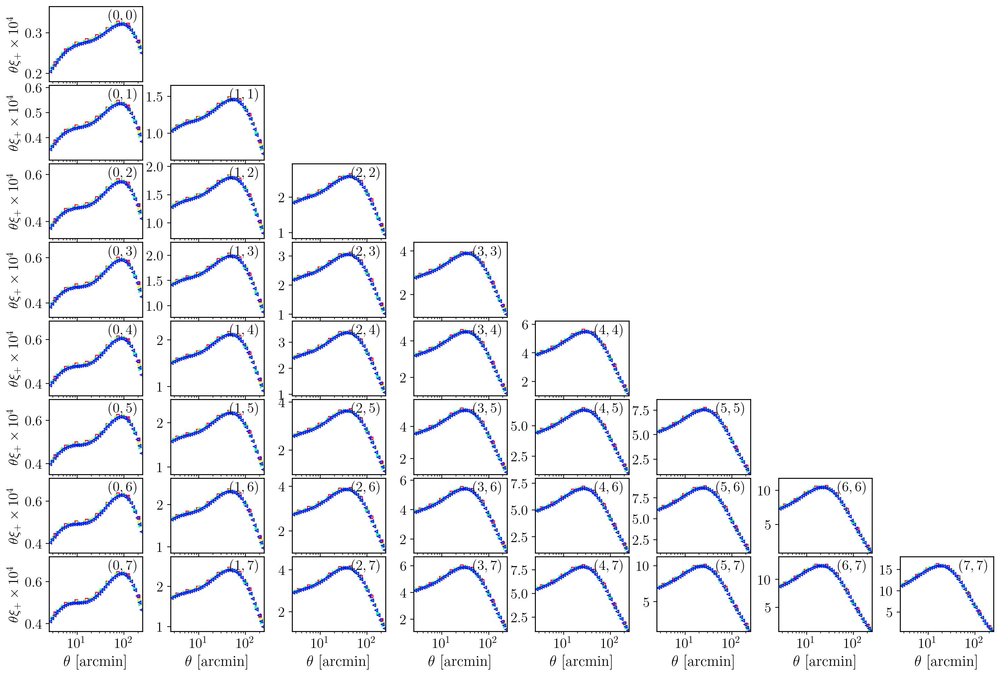

In [39]:
cnu.plot_xi(pm = 1,
            xi = result,
            marker=['s', 'o', ">", "<"],
            yaxislabelsize = 15,
            xaxisticklabelsize=15,
            yaxisticklabelsize=15,
            figsize = (18, 12),
            thetashow=[2.5,250],
            wspace=0.3,
            rescale=None)

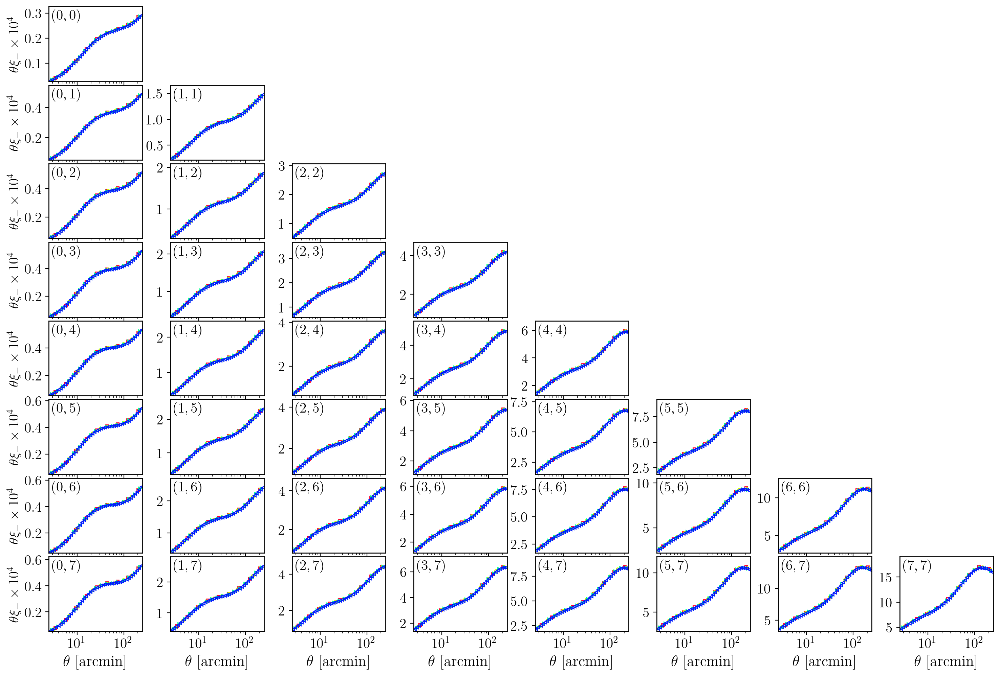

In [40]:
cnu.plot_xi(pm = -1,
            xi = result,
            marker=['s', 'o', ">", "<"],
            yaxislabelsize = 15,
            xaxisticklabelsize=15,
            yaxisticklabelsize=15,
            figsize = (18, 12),
            thetashow=[2.5,250],
            wspace=0.3,
            rescale=None)

# Add Baryon Contamination to $C_\ell^{\rm EE}$ and $\xi(\theta)$ data vectors

In [26]:
lmin = 100.
lmax = 4500.
ell = np.arange(lmin, lmax, 20.) # Make sure np.arange are set w/ float numbers (otherwise there are aliasing problems)
param = ("TNG100-1", "HzAGN-1", "mb2-1", "illustris-1", "eagle-1", "owls_AGN-1", "owls_AGN-2", "owls_AGN-3", "BAHAMAS-2")
C_ss = []
for x in param:
    (Cl, tmp) = nw.C_ss_tomo_limber(ell=ell, baryon_sims=x,allsims=allsims)
    C_ss.append(Cl)
    
# Plot the Ratio over ref cosmology
(C_ss_ref, tmp) = nw.C_ss_tomo_limber(ell=ell)

xi_theta = []
for x in param:
    xi_theta.append(nw.xi(baryon_sims=x,allsims=allsims, ntheta=40, AccuracyBoost=1.0))

xi_theta_ref = nw.xi(ntheta=40, AccuracyBoost=1.0)

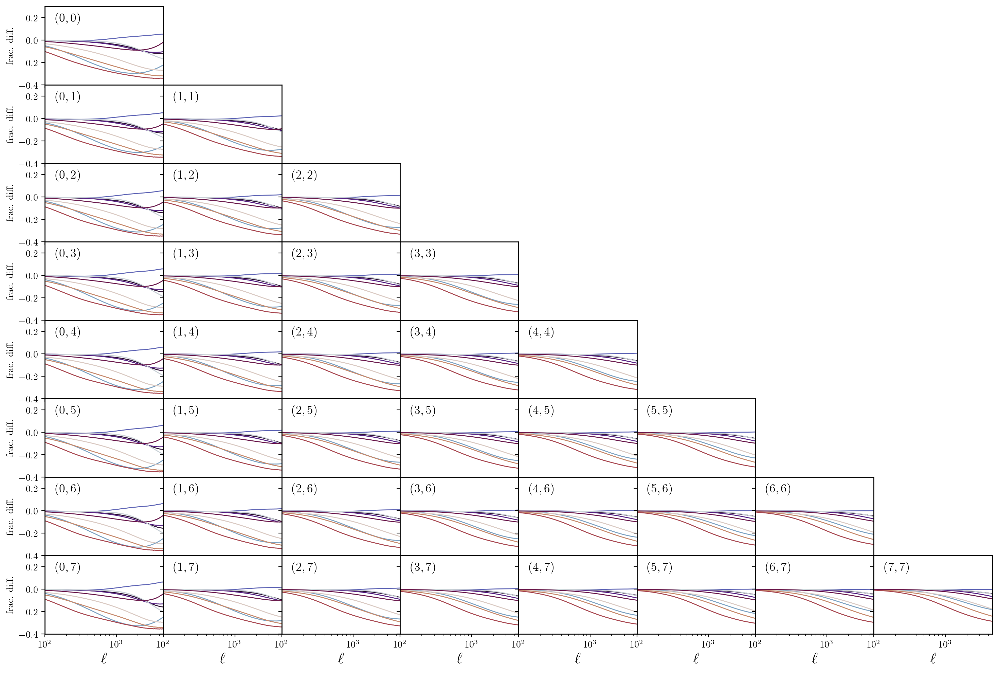

In [27]:
cnu.plot_C_ss_tomo_limber(ell=ell,
                          C_ss=C_ss,
                          C_ss_ref=C_ss_ref,
                          lmin=lmin,
                          lmax=lmax,
                          cmap="twilight_shifted",
                          yaxislabelsize = 10,
                          xaxisticklabelsize=10,
                          yaxisticklabelsize=10,
                          ylim=(0.6,1.3),
                          figsize = (18, 12),
                          wspace=0.4)

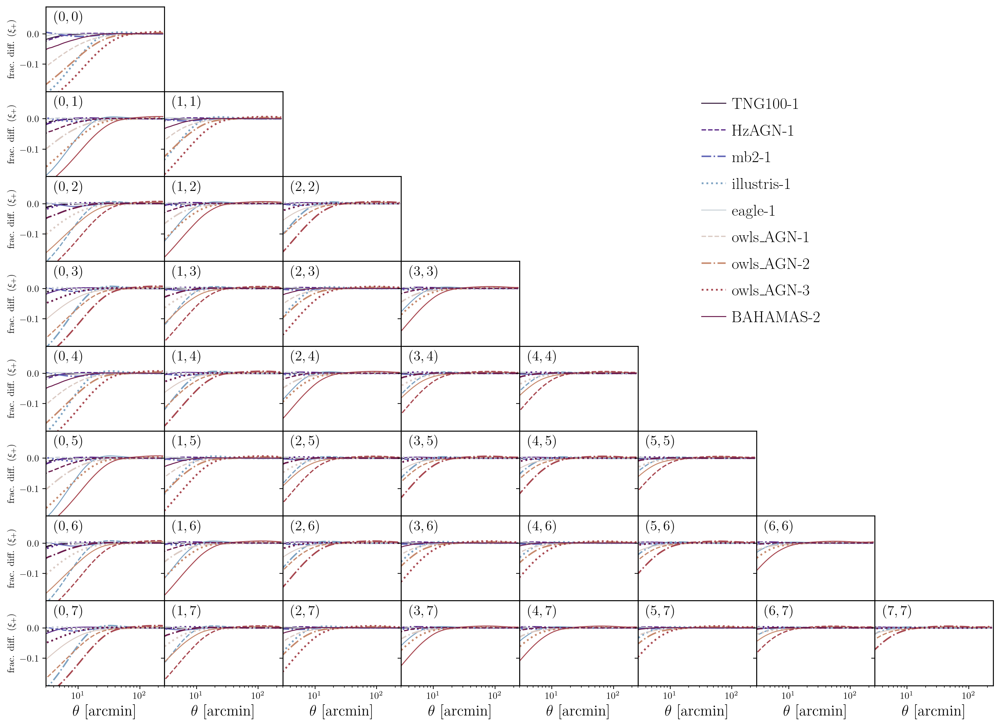

In [28]:
matplotlib.rcParams['legend.fontsize'] = 17
cnu.plot_xi(pm = 1,
            param=None,
            xi=xi_theta,
            xi_ref=xi_theta_ref,
            cmap="twilight_shifted",
            ylim=(0.81,1.09),
            linewidth=[1.0, 1.3, 1.6, 1.9],
            linestyle = ['solid', 'dashed', 'dashdot', 'dotted'],
            legend = param,
            legendloc=(0.7,0.55),
            bintextpos = [[0.2, 0.875],[0.2,0.875]],
            yaxislabelsize = 10,
            xaxisticklabelsize=10,
            yaxisticklabelsize=10,
            figsize = (18, 13),
            wspace=0.4)

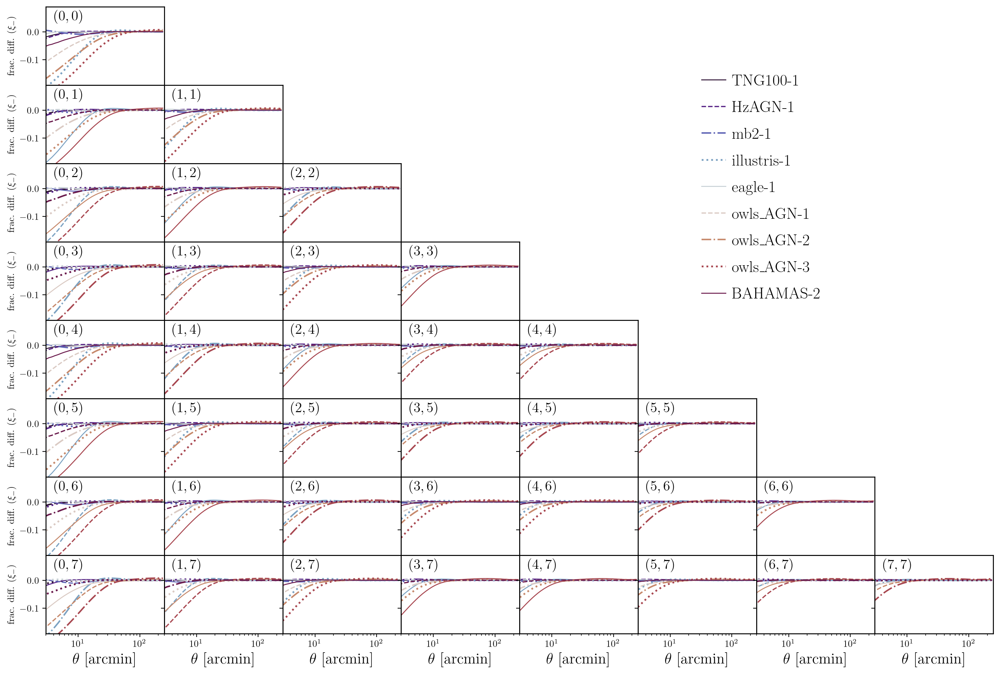

In [29]:
cnu.plot_xi(pm = -1,
            param=None,
            xi=xi_theta,
            xi_ref=xi_theta_ref,
            cmap="twilight_shifted",
            ylim=(0.81,1.09),
            linewidth=[1.0, 1.3, 1.6, 1.9],
            linestyle = ['solid', 'dashed', 'dashdot', 'dotted'],
            legend = param,
            legendloc=(0.7,0.55),
            bintextpos = [[0.2, 0.875],[0.2,0.875]],
            yaxislabelsize = 10,
            xaxisticklabelsize=10,
            yaxisticklabelsize=10,
            figsize = (18, 12),
            wspace=0.4)

# Check how CAMB and Cosmolike Accuracy Boost affect $C_\ell^{\rm EE}$ and $\xi(\theta)$ data vectors (and $\chi^2)$

In [13]:
lmin = 100.
lmax = 6500.
ell = np.arange(lmin, lmax, 30.) # Make sure np.arange are set w/ float numbers (otherwise there are aliasing problems)
param = np.arange(1.0, 10.0, 0.5)
C_ss = []
for x in param:
    # Change only Cosmolike Settings
    (Cl, tmp) = nw.C_ss_tomo_limber(ell=ell, AccuracyBoost=1,CAMBAccuracyBoost=1.,CLAccuracyBoost=1+x,CLIntegrationAccuracy=int(x))
    C_ss.append(Cl)
# Plot the Ratio over ref cosmology
(C_ss_ref, tmp) = nw.C_ss_tomo_limber(ell=ell,CAMBAccuracyBoost=1.,CLAccuracyBoost=1,CLIntegrationAccuracy=0)

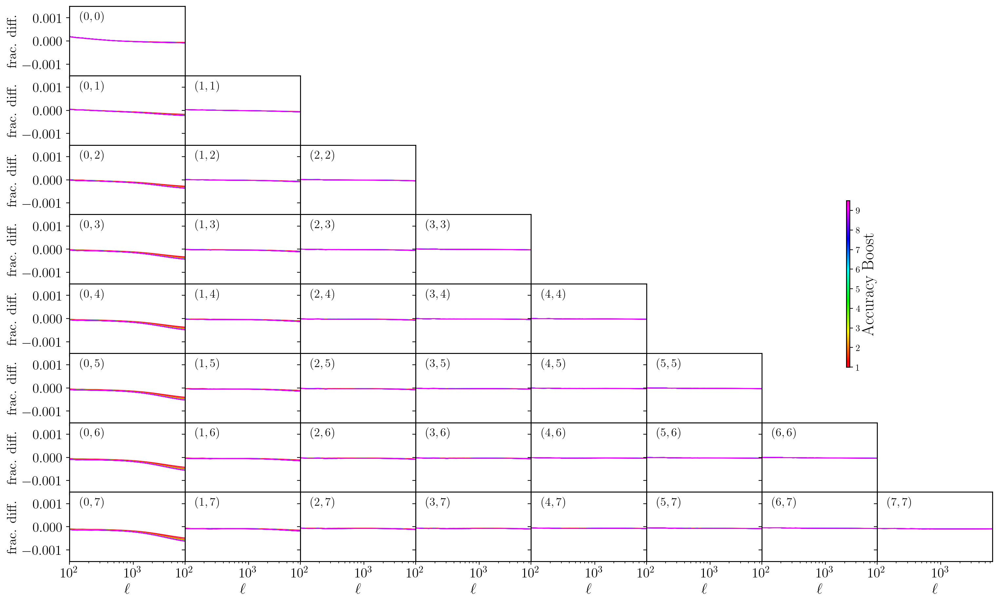

In [14]:
cnu.plot_C_ss_tomo_limber(ell=ell,
                          C_ss=C_ss,
                          C_ss_ref=C_ss_ref,
                          param=param,
                          lmin=lmin,
                          lmax=lmax,
                          ylim=(0.9985,1.0015),
                          colorbarlabel="Accuracy Boost",
                          yaxislabelsize = 15,
                          xaxisticklabelsize=15,
                          yaxisticklabelsize=15,
                          figsize = (18, 11),
                          wspace=0.4)

In [15]:
param = np.arange(0,10.0,1.0)
xi_theta_ref = nw.xi(ntheta=40,AccuracyBoost=1,CAMBAccuracyBoost=1.,CLAccuracyBoost=1,CLIntegrationAccuracy=0)
xi_theta = []
for x in param:
    xi_theta.append(nw.xi(ntheta=40,AccuracyBoost=1,CAMBAccuracyBoost=1.,CLAccuracyBoost=1+x,CLIntegrationAccuracy=int(x)))

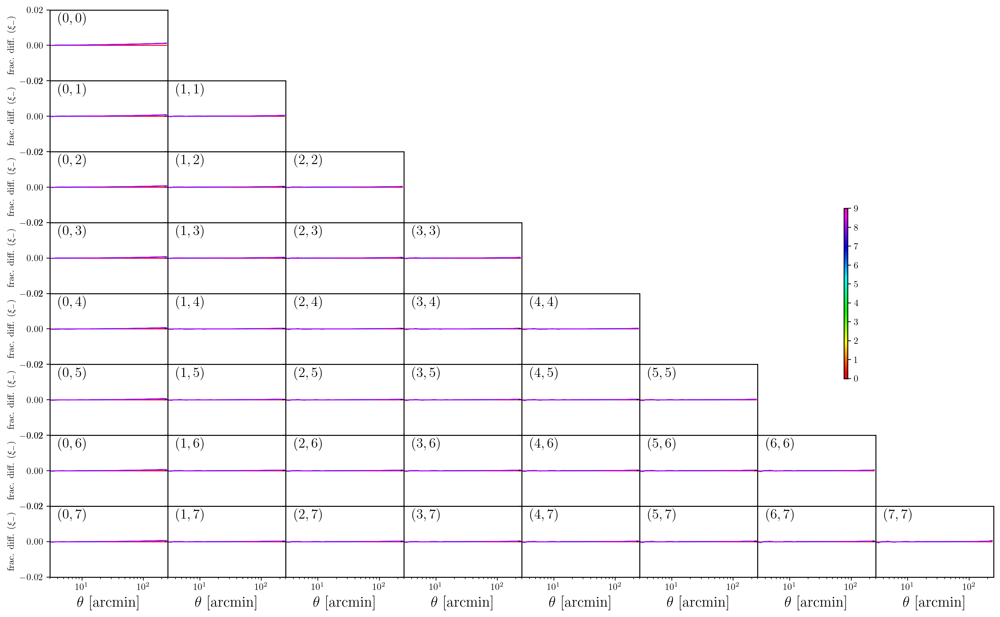

In [16]:
cnu.plot_xi(pm=0,
            xi=xi_theta,
            xi_ref=xi_theta_ref,
            param=param,
            ylim=(0.98,1.02),
            yaxislabelsize = 10,
            xaxisticklabelsize=10,
            yaxisticklabelsize=10,
            figsize = (18, 11),
            wspace=0.4)

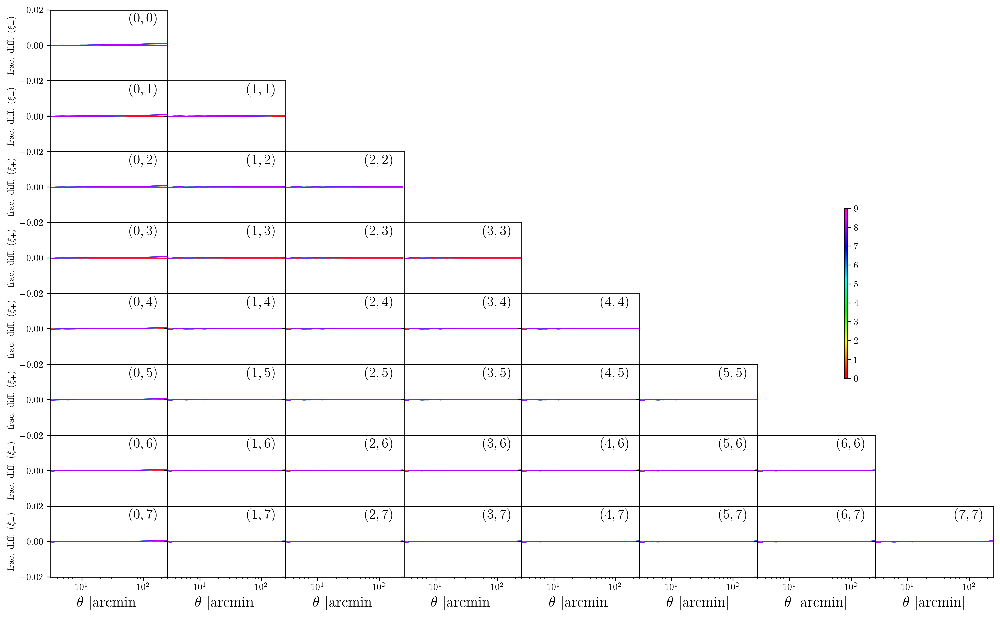

In [17]:
cnu.plot_xi(pm=1,
            xi=xi_theta,
            xi_ref=xi_theta_ref,
            param=param,
            ylim=(0.98,1.02),
            yaxislabelsize = 10,
            xaxisticklabelsize=10,
            yaxisticklabelsize=10,
            figsize = (18, 11),
            wspace=0.4)

In [18]:
lmin = 100.
lmax = 6500.
ell = np.arange(lmin, lmax, 30.) # Make sure np.arange are set w/ float numbers (otherwise there are aliasing problems)
param = np.arange(1.,6.0,1.0)
C_ss = []
for x in param:
    # Change only CAMB Settings
    (Cl, tmp) = nw.C_ss_tomo_limber(ell=ell, AccuracyBoost=1,CAMBAccuracyBoost=1.+x/3,CLAccuracyBoost=1,CLIntegrationAccuracy=0)
    C_ss.append(Cl)
# Plot the Ratio over ref cosmology
(C_ss_ref, tmp) = nw.C_ss_tomo_limber(ell=ell,CAMBAccuracyBoost=1.,CLAccuracyBoost=1,CLIntegrationAccuracy=0)

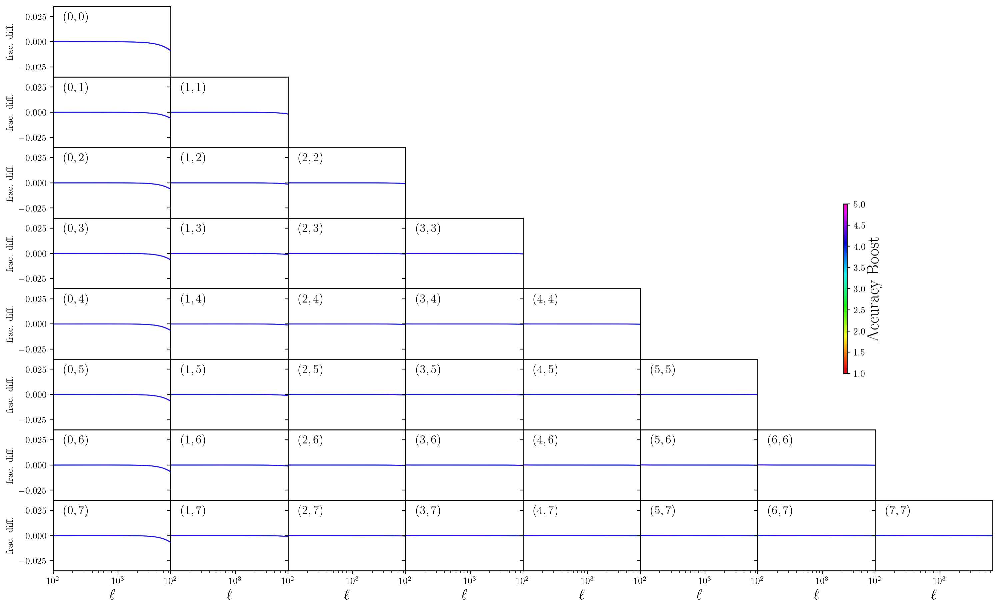

In [19]:
cnu.plot_C_ss_tomo_limber(ell=ell,
                          C_ss=C_ss,
                          C_ss_ref=C_ss_ref,
                          param=param,
                          lmin=lmin,
                          lmax=lmax,
                          ylim=(0.965,1.035),
                          colorbarlabel="Accuracy Boost",
                          yaxislabelsize = 10,
                          xaxisticklabelsize=10,
                          yaxisticklabelsize=10,
                          figsize = (18, 11),
                          wspace=0.4)

In [20]:
param = np.arange(1.,6.0,1.0)
xi_theta_ref = nw.xi(ntheta=40,AccuracyBoost=1,CAMBAccuracyBoost=1.,CLAccuracyBoost=1,CLIntegrationAccuracy=0)
xi_theta = []
for x in param:
    xi_theta.append(nw.xi(ntheta=40,AccuracyBoost=1,CAMBAccuracyBoost=1+x/3,CLAccuracyBoost=1,CLIntegrationAccuracy=0))

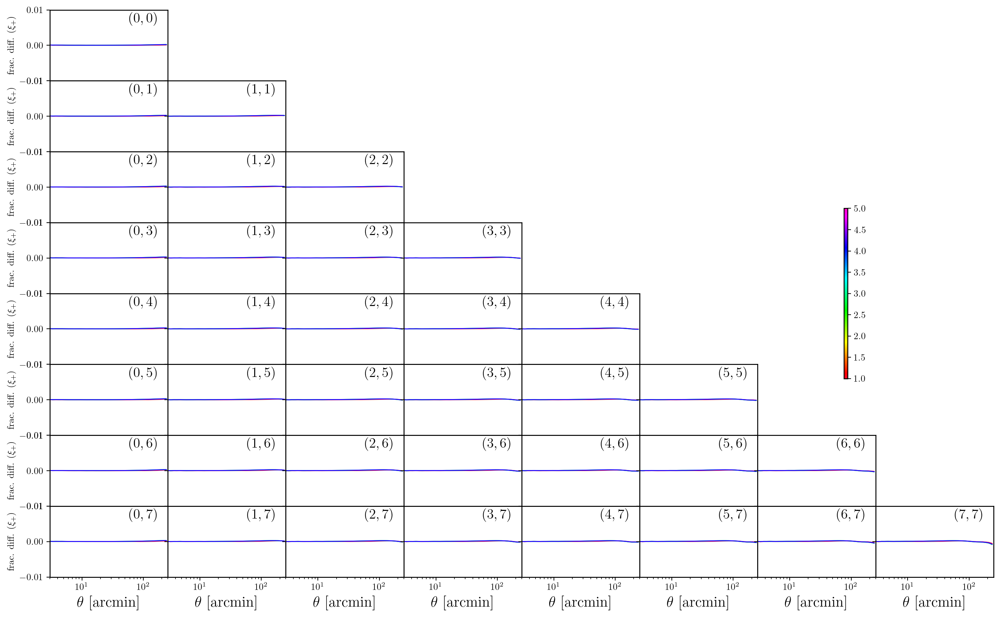

In [21]:
cnu.plot_xi(pm = 1,
            xi = xi_theta,
            xi_ref = xi_theta_ref,
            param=param,
            ylim=(0.99, 1.01),
            yaxislabelsize = 10,
            xaxisticklabelsize=10,
            yaxisticklabelsize=10,
            figsize = (18, 11),
            wspace=0.4)

# Let's compute $\chi^2_{\rm Roman Real}$ and reproduce the results shown on EXAMPLE_EVALUATE1.YAML

In [ ]:
# Re-init with the chi2 machinery: probes, covariance, mask, and
# data vector (nw.init_cosmolike holds the full sequence)
ini = nw.init_cosmolike(CLprobe="xi", with_data=True)
allsims = nw.allsims

In [31]:
nw.get_chi2(omegam = 0.3)

0.019971655234642192

In [32]:
param = np.arange(0.295, 0.305, 0.001)      
chi2 = []
for x in param:
    chi2.append(nw.get_chi2(omegam = x))

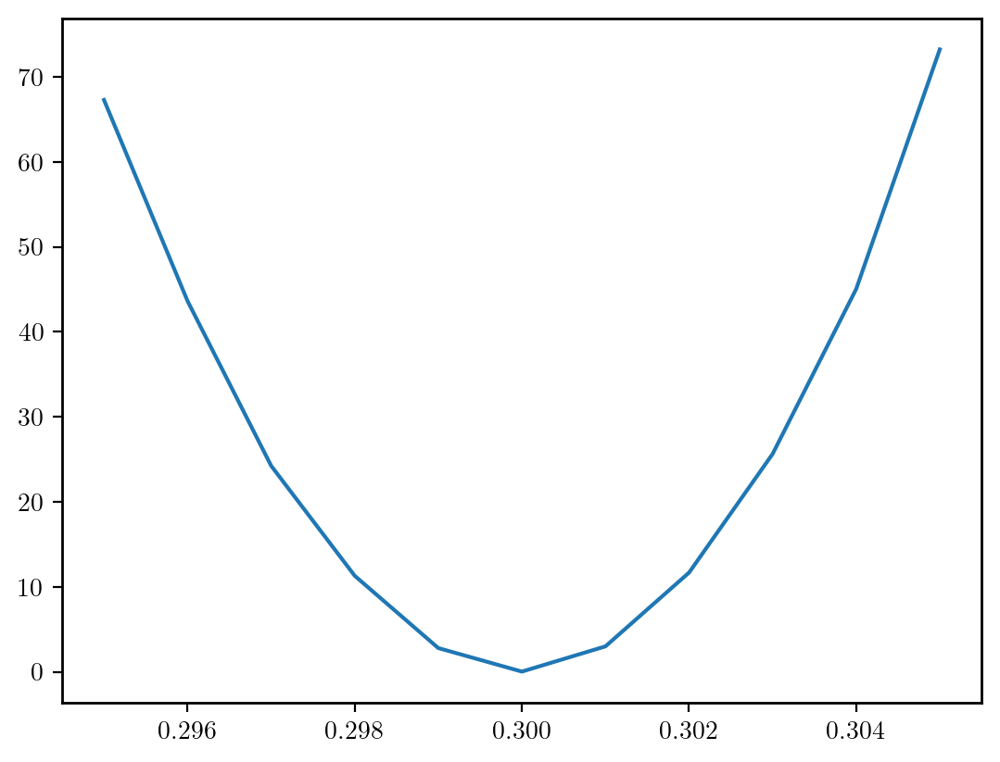

In [33]:
plt.plot(param, chi2)

# Let's compute $\chi^2_{\rm Roman Real}$ as function of CAMB+Cosmolike Integration Accuracy

In [34]:
param = np.arange(0., 6., 0.5)      
chi2 = []
for x in param:
    chi2.append(nw.get_chi2(AccuracyBoost = 1, CAMBAccuracyBoost = 1.+ x/3.0, CLAccuracyBoost = 1 + x, CLIntegrationAccuracy = 1))
chi2 = np.array(chi2)

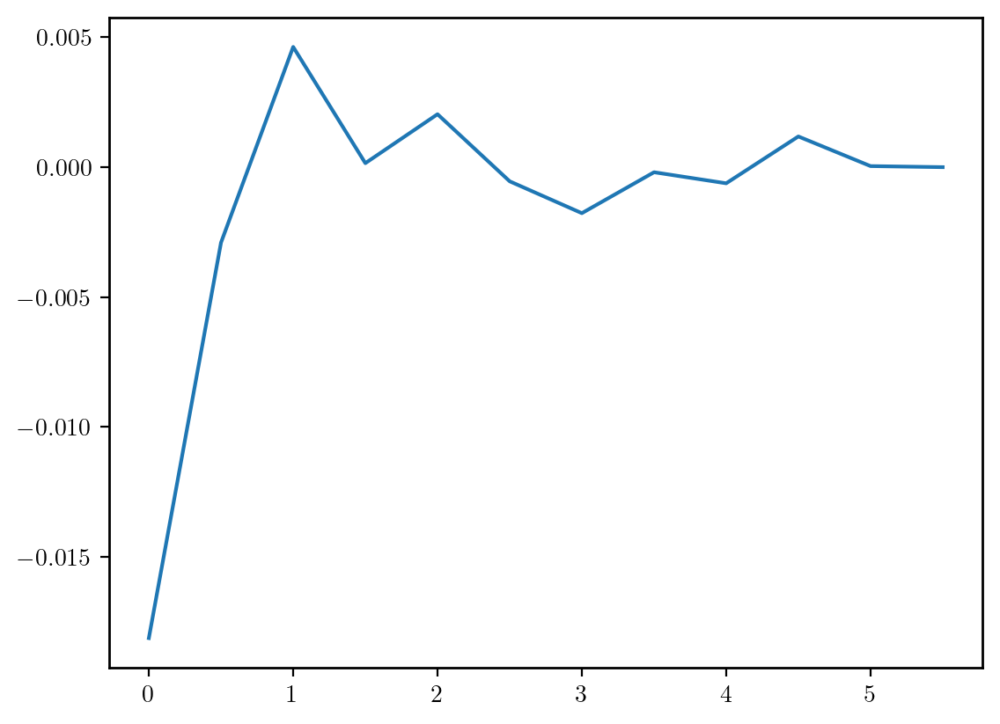

In [35]:
plt.plot(param, np.array(chi2 - chi2[-1]))

In [36]:
# Do we get the similar behaviour by just changing AccuracyBoost (which we design to change all parameters at once)
param = np.arange(0, 6, 0.5)      
chi2 = []
for x in param:
    chi2.append(nw.get_chi2(AccuracyBoost = 1 + x))
chi2 = np.array(chi2)

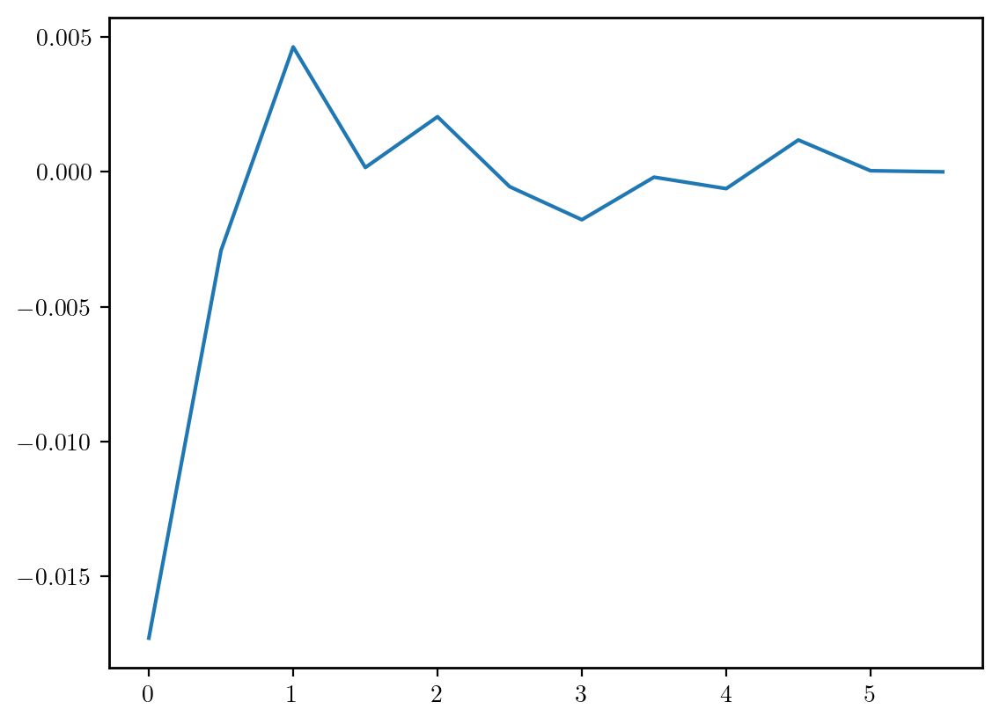

In [37]:
plt.plot(param, np.array(chi2 - chi2[-1]))

# Let's Plot HALOFIT VS EE2

In [30]:
print(rf"$\chi^2$={nw.get_chi2(non_linear_emul=1):3.3f}")
print(rf"$\chi^2$={nw.get_chi2(non_linear_emul=2):3.3f}")

/Users/vivianmiranda/data/COCOA/september2026/test/cocoa/Cocoa/.local/lib/python3.11/site-packages/euclidemu2/ee2_bindata.dat
$\chi^2$=9.735
$\chi^2$=0.020


In [33]:
lmin = 100.
lmax = 6500.
ell = np.arange(lmin, lmax, 20.) # Make sure np.arange are set w/ float numbers (otherwise there are aliasing problems)
param = [1]
C_ss = []
for x in param:
    # Change only Cosmolike Settings
    (Cl, tmp) = nw.C_ss_tomo_limber(ell=ell, AccuracyBoost=1,CAMBAccuracyBoost=1.,CLAccuracyBoost=1,CLIntegrationAccuracy=0,non_linear_emul=2)
    C_ss.append(Cl)
(C_ss_ref, tmp) = nw.C_ss_tomo_limber(ell=ell,CAMBAccuracyBoost=1.,CLAccuracyBoost=1,CLIntegrationAccuracy=0,non_linear_emul=1)

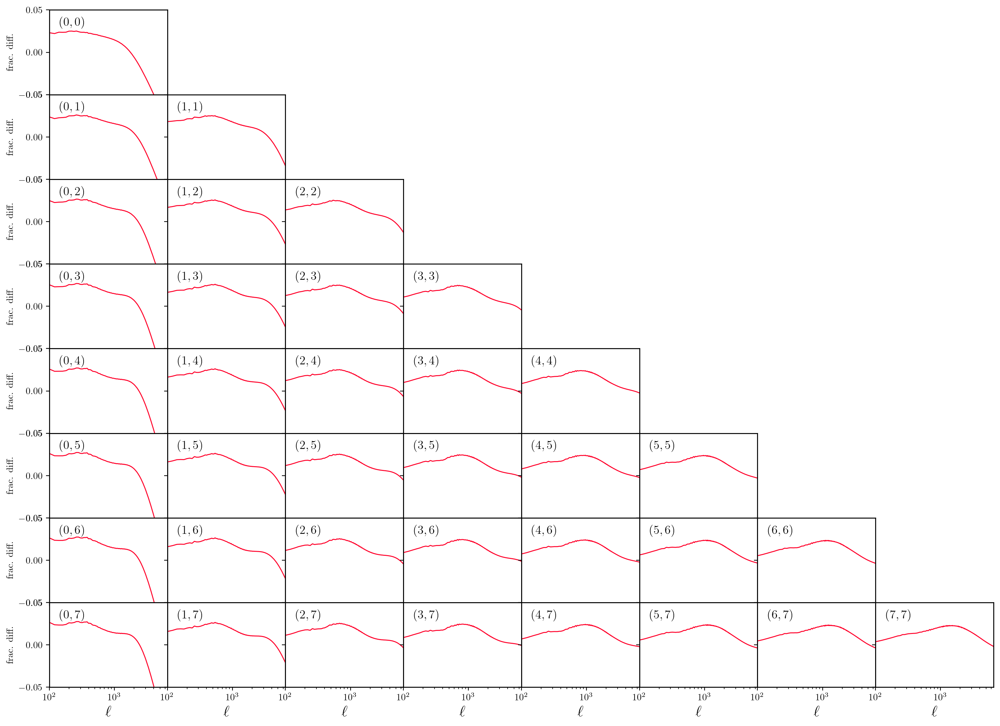

In [34]:
# Plot the Ratio over ref cosmology
cnu.plot_C_ss_tomo_limber(ell=ell,
                          C_ss=C_ss,
                          C_ss_ref=C_ss_ref,
                          param=param,
                          lmin=lmin,
                          lmax=lmax,
                          ylim=(0.95,1.05),
                          colorbarlabel="Accuracy Boost",
                          colorbar=None,
                          yaxislabelsize = 10,
                          xaxisticklabelsize=10,
                          yaxisticklabelsize=10,
                          figsize = (18, 13),
                          wspace=0.3)

In [35]:
param = [1]
xi_theta_ref = nw.xi(ntheta=40,AccuracyBoost=1,CAMBAccuracyBoost=1.,CLAccuracyBoost=1,CLIntegrationAccuracy=0,non_linear_emul=2)
xi_theta = []
for x in param:
    xi_theta.append(nw.xi(ntheta=40,AccuracyBoost=1,CAMBAccuracyBoost=1+x/3,CLAccuracyBoost=1,CLIntegrationAccuracy=0,non_linear_emul=1))

In [ ]:
cnu.plot_xi(pm = 1,
            xi = xi_theta,
            xi_ref = xi_theta_ref,
            param=param,
            ylim=(0.965, 1.035),
            colorbar=None,
            yaxislabelsize = 10,
            xaxisticklabelsize=10,
            yaxisticklabelsize=10,
            figsize = (18, 13),
            thetashow=[2.5,250],
            wspace=0.3)

# Let's investigate Fisher

In [ ]:
# The Fisher machinery is shared: the generic pieces live in
# cosmolike_core (cnu.fisher), and this project's data vector,
# fiducial vector, priors, and labels live in the wrappers module.
ini = nw.init_cosmolike(CLprobe="xi", with_data=True)
param = nw.fisher_fiducial_point()
param_names = nw.FISHER_PARAM_NAMES
param_labels = nw.FISHER_PARAM_LABELS
flat_priors = nw.FISHER_FLAT_PRIORS
gaussian_priors = nw.FISHER_GAUSSIAN_PRIORS
invcov = ci.get_inv_cov_masked()

### Fisher based on 5-stencil rule - Test Accuracy Boost

In [56]:
AB1 = np.arange(0, 5.0, 1.0)
FOM1 = []
F1 = []
for x in AB1:
    F = nw.get_Fisher(CV = param, h = 0.03, AccuracyBoost = 1 + x)
    F1.append(F)
    FOM1.append(cnu.get_FoM(0, 4, F))

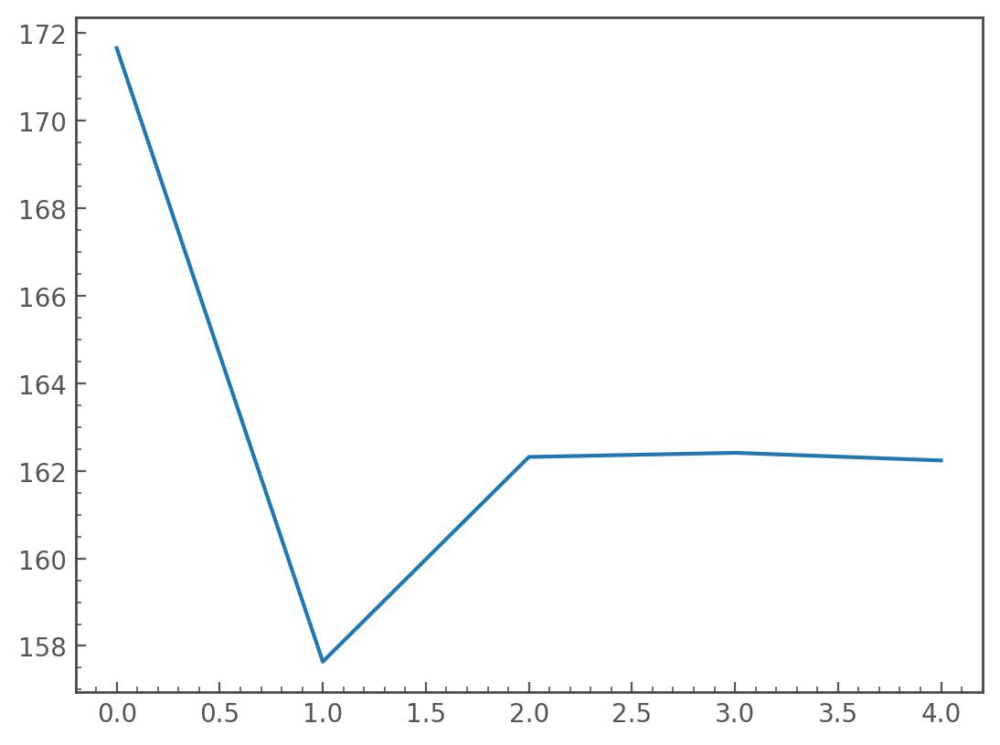

In [57]:
plt.plot(AB1, FOM1) # This show we need high accuracy boost to do Fisher

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


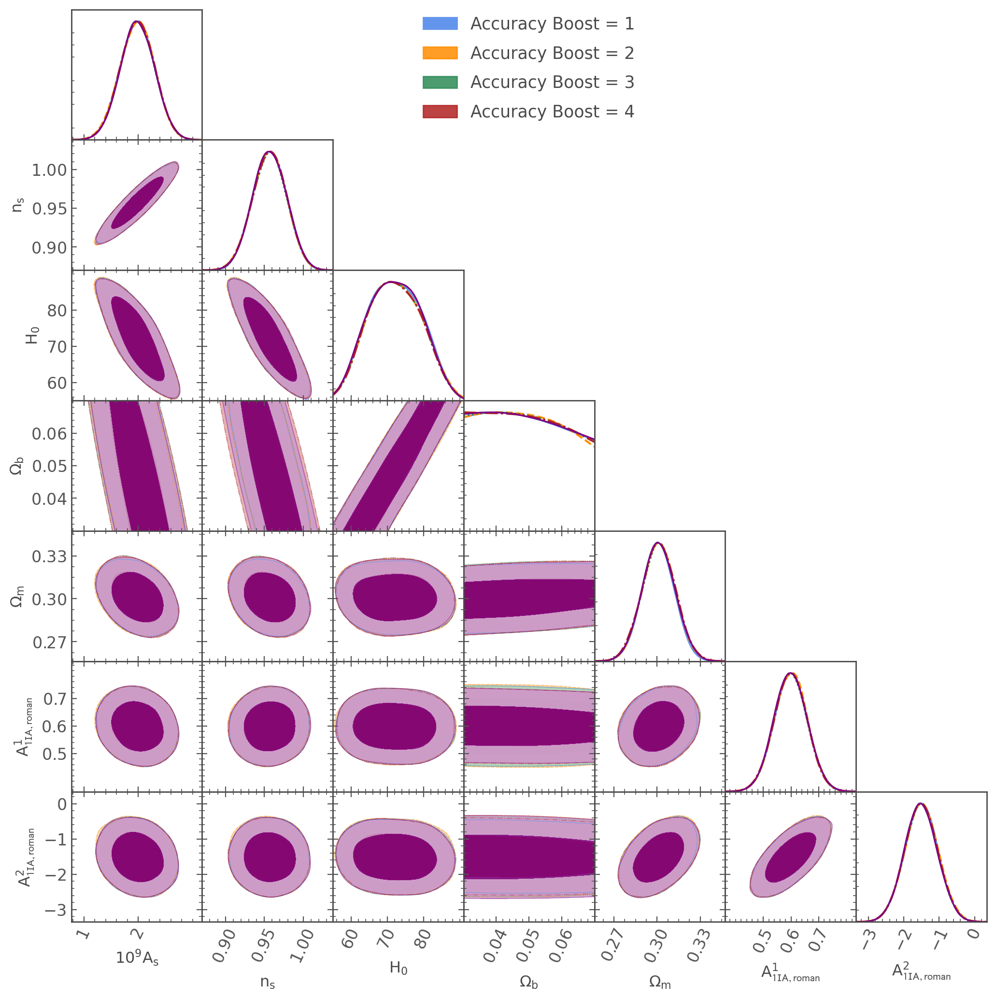

In [58]:
sel = [0, 1, 2, 3, 4, 5, 6]
g = nw.plot_Fisher(F=F1,
                mu=param,
                select=sel,
                filled=True,
                flat_priors=flat_priors,
                chain_names=['Accuracy Boost = 1', 'Accuracy Boost = 2', 'Accuracy Boost = 3','Accuracy Boost = 4'])

### Fisher based on 5-stencil rule - Test Step Size

In [59]:
hs2 = np.arange(0.02, 0.1, 0.01)
F2 = []
FOM2 = []
for x in hs2:
    F = nw.get_Fisher(CV = param, h = x, AccuracyBoost = 3.0)
    F2.append(F)
    FOM2.append(cnu.get_FoM(0, 4, F))

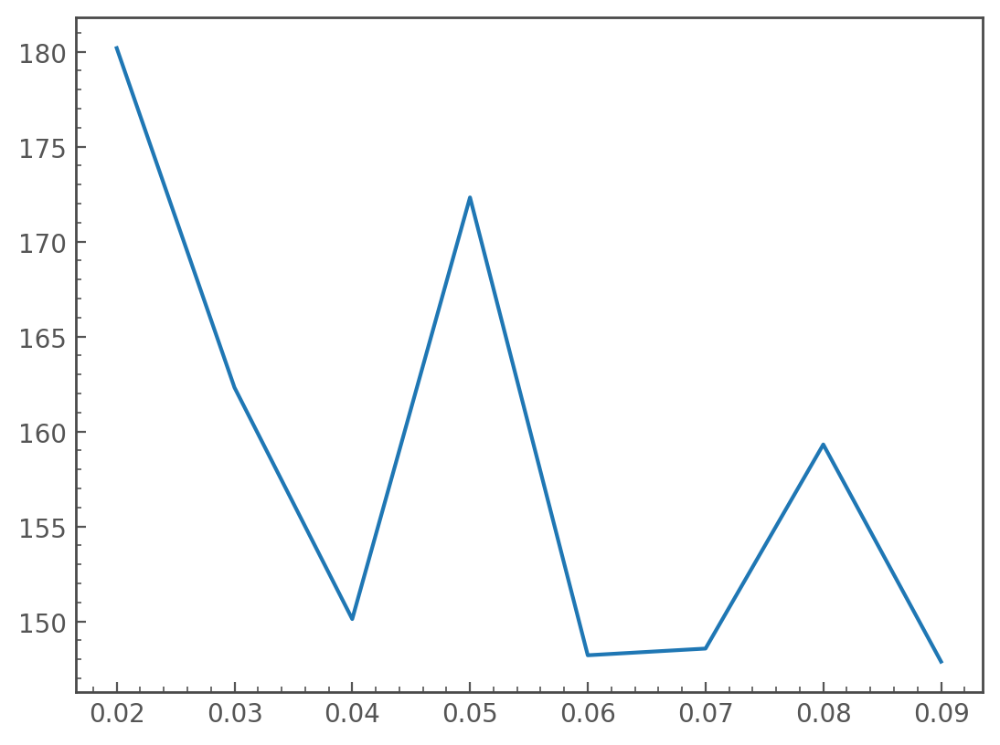

In [60]:
plt.plot(hs2, FOM2) 

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


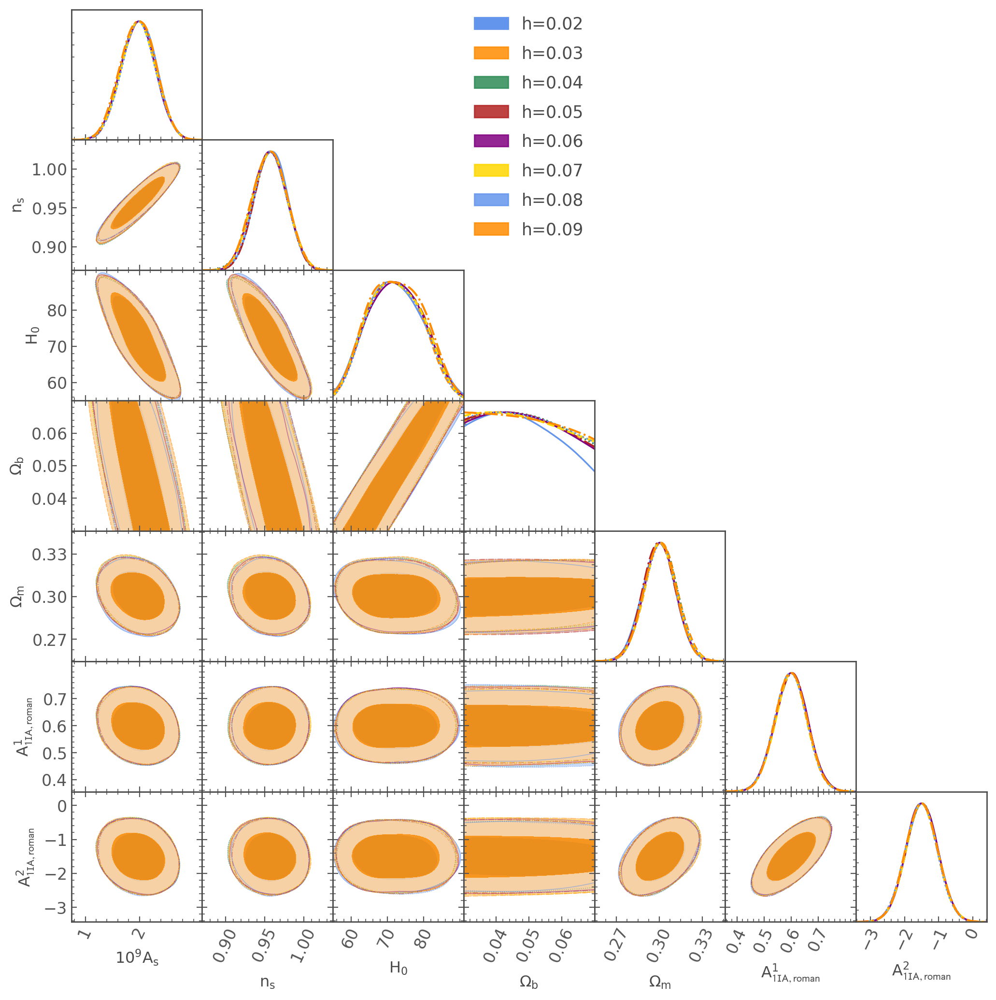

In [61]:
sel = [0, 1, 2, 3, 4, 5, 6]
g = nw.plot_Fisher(F=F2,
                mu=param,
                select=sel,
                filled=True,
                flat_priors=flat_priors,
                chain_names=['h=0.02','h=0.03','h=0.04','h=0.05','h=0.06','h=0.07','h=0.08','h=0.09'])

### Fisher based on 5-stencil rule - Test accuracy vs DerivativeKit and true chain?

In [62]:
F = nw.get_Fisher(CV=param, h=0.06, AccuracyBoost = 3.0)

In [63]:
F2 = nw.get_Fisher2(CV=param, AccuracyBoost = 2.5)

Removed no burn in
Removed no burn in
./example_chains/EXAMPLE_MCMC1_THIN.txt
Removed no burn in


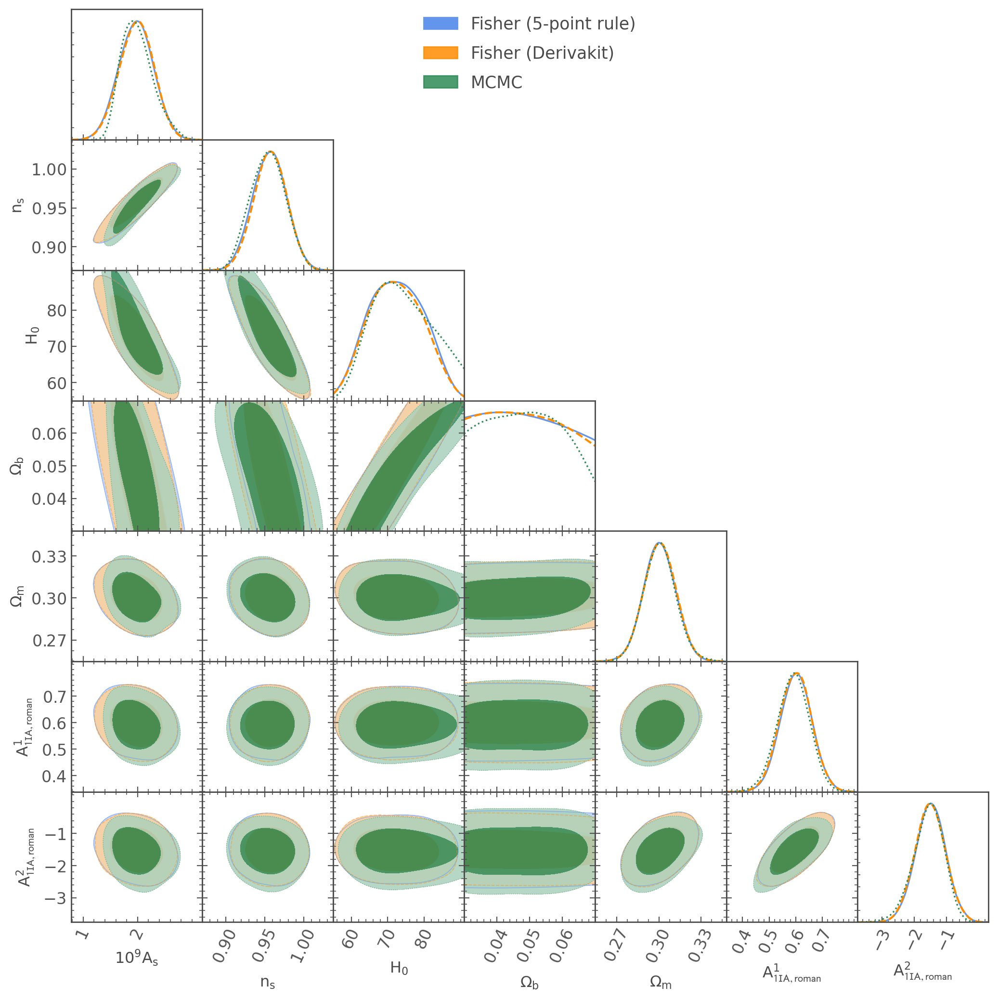

In [66]:
sel = [0, 1, 2, 3, 4, 5, 6]
g = nw.plot_Fisher(F=F,
                F2=F2,
                mu=param,
                select=sel,
                filled=True,
                root='./example_chains/EXAMPLE_MCMC1_THIN',
                chain_names=['Fisher (5-point rule)', 'Fisher (Derivakit)', 'MCMC'])

# Plot Reponse Function $d\ln C_{\mathrm{ss}}^{\mathrm{EE}} \big/ d\ln k$ (normalized)

In [ ]:
# dlnC_dlss_tomo_limber lives in this project's interface/
# (cosmolike_roman_real_notebook_wrappers, imported above as nw),
# shared by every notebook of this project; call as
# nw.dlnC_dlss_tomo_limber.

In [10]:
ell  = [30.,300.,3000.]
kk = 10.0 ** np.arange(-2.2, 1.6, 0.025)
(dlnCEEdlnk, tmp) = nw.dlnC_dlss_tomo_limber(k=kk, ell=ell, CLAccuracyBoost=1.00)

In [ ]:
cnu.plot_response_function(k=kk,
                           resp=dlnCEEdlnk,
                           labels=[r"$\ell=30$", r"$\ell=300$", r"$\ell=3000$"],
                           ylabel=r"$d\ln C_{\mathrm{ss}}^{\mathrm{EE}} / d\ln k$ (normalized)",
                           normalize=True,
                           xtickformat="scalar")


# Plot Reponse Function $d\ln \xi_{\pm} \big/ d\ln k$ (normalized)

In [ ]:
# dlnxi_dlnk_pm_tomo_limber lives in this project's interface/
# (cosmolike_roman_real_notebook_wrappers, imported above as nw),
# shared by every notebook of this project; call as
# nw.dlnxi_dlnk_pm_tomo_limber.

In [10]:
kk = 10.0**np.arange(-3., 1.02, 0.02)

In [11]:
(theta, dlnxip_dlnk, dlnxim_dlnk) = nw.dlnxi_dlnk_pm_tomo_limber(k = kk)

In [12]:
print(theta)

[2.97200132245545, 4.0400089913792465, 5.491812041638084, 7.465329796304372, 10.148043768622234, 13.794808151791631, 18.75206062208114, 25.490733448767543, 34.65099142176315, 47.1030466394507, 64.02982747918657, 87.03935519068173, 118.31750373639919, 160.835654856868, 218.63297531081636]


In [ ]:
cnu.plot_response_function(k=kk,
                           resp=dlnxip_dlnk,
                           labels=[r"$\theta=10.148$'", r"$\theta=160.8$'"],
                           idx=[4, 13],
                           ncolors=3,
                           ylabel=r"$d\ln \xi_{+} / d\ln k$ (normalized)",
                           normalize=True)


In [ ]:
cnu.plot_response_function(k=kk,
                           resp=dlnxim_dlnk,
                           labels=[r"$\theta=10.148$'", r"$\theta=160.8$'"],
                           idx=[4, 13],
                           ncolors=3,
                           ylabel=r"$d\ln \xi_{-} / d\ln k$ (normalized)",
                           normalize=True)


# Plot Reponse Function $\int_{-\infty}^{\ln k_\alpha} d\ln k \big|d\ln C_{\mathrm{ss}}^{\mathrm{EE}} (\ell)\big/d\ln k\big| \bigg/ \int_{-\infty}^{\infty} d\ln k \big|d\ln C_{\mathrm{ss}}^{\mathrm{EE}}(\ell) \big/d\ln k\big|$ as a function of $k_\alpha$

In [ ]:
# rf_C_ss_tomo_limber lives in this project's interface/
# (cosmolike_roman_real_notebook_wrappers, imported above as nw),
# shared by every notebook of this project; call as
# nw.rf_C_ss_tomo_limber.

In [19]:
ell  = [30.,300.,3000.]
kk = 10.0 ** np.arange(-2.2, 1.6, 0.05)
(rfCEE, tmp) = nw.rf_C_ss_tomo_limber(k=kk, ell=ell, CLAccuracyBoost=1.00, CLIntegrationAccuracy=0)

In [ ]:
cnu.plot_response_function(k=kk,
                           resp=rfCEE,
                           labels=[r"$\ell=30$", r"$\ell=300$", r"$\ell=3000$"],
                           ylabel=r"$R_{C_{\mathrm{ss}}(\ell)}(k_{\mathrm{max}})$",
                           normalize=False)


# Plot Reponse Function $\int_{-\infty}^{\ln k_\alpha} d\ln k \big|d\ln \xi_{\pm} (\theta)\big/d\ln k\big| \bigg/ \int_{-\infty}^{\infty} d\ln k \big|d\ln \xi_{\pm}(\ell) \big/d\ln k\big|$ as a function of $k_\alpha$

In [ ]:
# rf_xi_tomo_limber lives in this project's interface/
# (cosmolike_roman_real_notebook_wrappers, imported above as nw),
# shared by every notebook of this project; call as
# nw.rf_xi_tomo_limber.

In [16]:
kk = 10.0 ** np.arange(-2, 1.2, 0.02)

In [17]:
(theta, rf_xip, rf_xim) = nw.rf_xi_tomo_limber(k = kk)

In [18]:
print(theta)

[2.97200132245545, 4.0400089913792465, 5.491812041638084, 7.465329796304372, 10.148043768622234, 13.794808151791631, 18.75206062208114, 25.490733448767543, 34.65099142176315, 47.1030466394507, 64.02982747918657, 87.03935519068173, 118.31750373639919, 160.835654856868, 218.63297531081636]


In [ ]:
cnu.plot_response_function(k=kk,
                           resp=rf_xip,
                           labels=[r"$\theta=10.148$'", r"$\theta=160.8$'"],
                           idx=[4, 13],
                           ncolors=3,
                           ylabel=r"$R_{\xi_+(\theta)}(k_{\mathrm{max}})$",
                           normalize=False)


In [ ]:
cnu.plot_response_function(k=kk,
                           resp=rf_xim,
                           labels=[r"$\theta=10.148$'", r"$\theta=160.8$'"],
                           idx=[4, 13],
                           ncolors=3,
                           ylabel=r"$R_{\xi_-(\theta)}(k_{\mathrm{max}})$",
                           normalize=False)
